# Import modules required for Visualization
---

In [1]:
import matplotlib.pyplot as plt
import hvplot.pandas
import holoviews as hv
import seaborn as sns
from MCForecastTools import MCSimulation

from mpt_quant_analysis import *
from mpt_performance_eval import *

import warnings
warnings.filterwarnings('ignore')

# Visualization for: "mpt_quant_analysis.py"
---

### Standard Asset Statistics / Frequencey Components

In [2]:
# Display constants being used for this module
print("Number of trading days per year = ", num_trading_days)
print("Risk free rate = ", risk_free_rate)
print("Number of random portfolio runs = ", num_random_portfolio_run)
print("Number of days in rolling window = ", rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.02
Number of random portfolio runs =  50000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.8
Number of days of input dataframe to use as test/experiment data  =  0.19999999999999996


In [3]:
# Get asset prices from .csv files
asset_mkt_prices_full_df = mpt_qa_get_asset_prices_csv('./Resources/dow.csv')

# Display the first 5 elements of the market and asset data prices
print("Asset Prices:")
display(asset_mkt_prices_full_df.head(n=1))
display(asset_mkt_prices_full_df.tail(n=1))

Asset Prices:


,MARKET,MSFT,AAPL,IBM,JPM,INTC
Date,,,,,,
2016-01-04,2012.660034,49.26915,24.151493,95.968582,52.617458,28.23418


,MARKET,MSFT,AAPL,IBM,JPM,INTC
Date,,,,,,
2020-12-31,3756.070068,219.139359,131.333542,110.466835,120.164391,47.337845


In [4]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_full_df.drop(['MARKET'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df.head(n=1))
display(asset_prices_df.tail(n=1))

Asset Prices DataFrame (does not include market)


,MSFT,AAPL,IBM,JPM,INTC
Date,,,,,
2016-01-04,49.26915,24.151493,95.968582,52.617458,28.23418


,MSFT,AAPL,IBM,JPM,INTC
Date,,,,,
2020-12-31,219.139359,131.333542,110.466835,120.164391,47.337845


In [5]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = asset_prices_df.shape[0]
num_historical_days_percent = round(num_days_total * historical_days_percent)
num_test_days_percent = round(num_days_total * test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data = ", num_historical_days_percent)
print("Total # of days will use for testing results = ", num_test_days_percent)

# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = asset_mkt_prices_full_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = asset_mkt_prices_full_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

# Extract the days from full dataframe will use for historical data
asset_prices_historical_df = asset_prices_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_prices_test_df = asset_prices_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  1259
Total # of days will use for hisotrical data =  1007
Total # of days will use for testing results =  252


In [6]:
# Plot the asset prices
asset_prices_historical_df.hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="(Historical) Market & Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [7]:
# Plot the asset prices
asset_prices_test_df.hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="(Test) Market & Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [8]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df          = mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [9]:
# Review the first five rows of the daily returns DataFrame.
print("Asset Retuns:")
display(asset_mkt_prices_returns_df.head())

# Plot the asset returns
asset_mkt_prices_returns_df.hvplot.line(
    ylabel="Returns", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="Market & Assets Returns"
)

Asset Retuns:


,MARKET,MSFT,AAPL,IBM,JPM,INTC
Date,,,,,,
2016-01-05,0.002010,0.004552,-0.025378,-0.000736,0.001728,-0.004718
2016-01-06,-0.013202,-0.018332,-0.019764,-0.005018,-0.014541,-0.022419
2016-01-07,-0.023986,-0.035402,-0.043121,-0.017237,-0.041280,-0.038206
2016-01-08,-0.010898,0.003062,0.005274,-0.009301,-0.022654,-0.010418
2016-01-11,0.000853,-0.000573,0.016063,0.012082,-0.001529,0.017304


:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [10]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 800,
    height = 500,    
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [11]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.hvplot(
    kind = "box",
    width = 800,
    height = 500,
    rot = 90,
    title = "Asset & Market: Daily Returns Box Plot")

:BoxWhisker   [Variable]   (value)

In [12]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


MARKET    0.128778
IBM       0.204571
JPM       0.206100
MSFT      0.219066
AAPL      0.243906
INTC      0.259195
dtype: float64

In [13]:
asset_mkt_prices_std_rolling_df.hvplot(
    title = "Assets & Market: Daily Return Standard Deviation w/ Rolling Window = 20",
    width = 800,
    height = 500
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [14]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 800,
    height = 500,
    title = "Assets & Market: Annual Sharpe Ratio")

Assets & Market: Annual Sharpe Ratio (Sorted):


IBM       0.186786
INTC      0.653618
MARKET    0.921503
JPM       1.073974
AAPL      1.123522
MSFT      1.302569
dtype: float64

:Bars   [index]   (0)

In [15]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['MARKET'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df.head(n=1))
display(asset_prices_df.tail(n=1))

# Recompute frequence components (e.g. covariance matrix will be different).  TODO: Optimize dataframe creating by sharing data
asset_prices_returns_df,        \
asset_prices_ann_returns_mean,  \
asset_prices_std_df,            \
asset_prices_ann_std_df,        \
asset_prices_std_rolling_df,    \
asset_prices_ann_cov_mtrx_df,   \
asset_prices_ann_corr_mtrx_df,  \
asset_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df      = mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,MSFT,AAPL,IBM,JPM,INTC
Date,,,,,
2016-01-04,49.26915,24.151493,95.968582,52.617458,28.23418


,MSFT,AAPL,IBM,JPM,INTC
Date,,,,,
2019-12-31,153.745239,72.039879,111.766243,127.204887,55.488392


In [16]:
print("Annual Covariance Matrix:")
display(asset_prices_ann_cov_mtrx_df)
print("Correlation Matrix:")
display(asset_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,MSFT,AAPL,IBM,JPM,INTC
MSFT,0.047990,0.031728,0.020970,0.020998,0.032926
AAPL,0.031728,0.059490,0.018381,0.020456,0.031645
IBM,0.020970,0.018381,0.041849,0.018457,0.022029
JPM,0.020998,0.020456,0.018457,0.042477,0.023294
INTC,0.032926,0.031645,0.022029,0.023294,0.067182


Correlation Matrix:


,MSFT,AAPL,IBM,JPM,INTC
MSFT,1.000000,0.593797,0.467927,0.465075,0.579874
AAPL,0.593797,1.000000,0.368381,0.406937,0.500556
IBM,0.467927,0.368381,1.000000,0.437767,0.415464
JPM,0.465075,0.406937,0.437767,1.000000,0.436057
INTC,0.579874,0.500556,0.415464,0.436057,1.000000


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

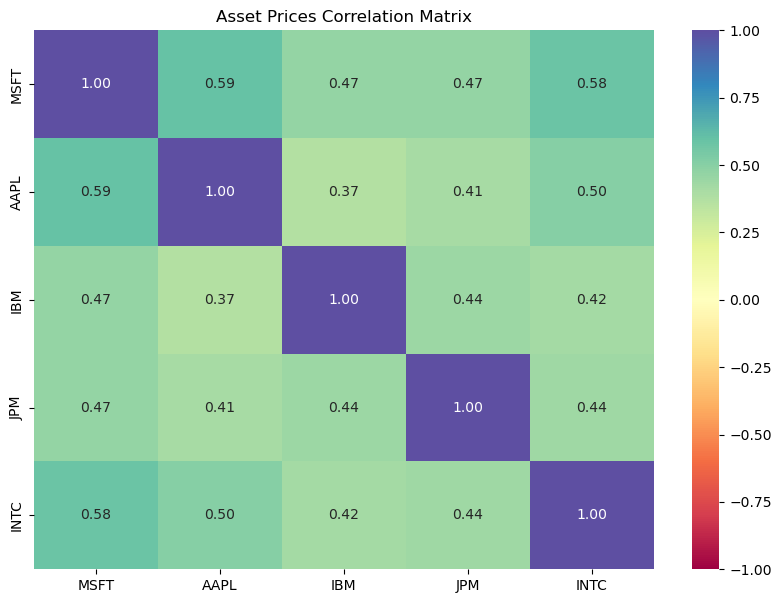

In [17]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(asset_prices_ann_corr_mtrx_df, annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral").set(title='Asset Prices Correlation Matrix')

In [18]:
print("Annual average asset returns:")
display(asset_prices_ann_returns_mean)

Annual average asset returns:


MSFT    0.285349
AAPL    0.274034
IBM     0.038211
JPM     0.221347
INTC    0.169414
dtype: float64

### Efficient Frontier Computation

In [19]:
# Determine the efficient frontier components
efficient_frontier_df = mpt_qa_get_efficient_frontier(asset_prices_df, asset_prices_ann_returns_mean, asset_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.head(n=1))
display(efficient_frontier_df.tail(n=1))

Efficient Frontier DataFrame:


,Returns,Volatility,SharpeRatio,MSFT_W,AAPL_W,IBM_W,JPM_W,INTC_W
0,0.16079,2.654284,0.053043,0.209757,0.058451,0.383395,0.216537,0.131859


,Returns,Volatility,SharpeRatio,MSFT_W,AAPL_W,IBM_W,JPM_W,INTC_W
49999,0.175268,2.672446,0.0581,0.268906,0.002764,0.304566,0.276311,0.147453


In [20]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the opt sharpe ratio points)
scatter = hv.Scatter((efficient_frontier_df['Volatility'], efficient_frontier_df['Returns'], efficient_frontier_df.loc[:,'SharpeRatio']), 'Volatility', ['Return', 'Sharpe Ratio'])

scatter.opts(title="Efficient Frontier + MinVol/MaxRet/OptSharpeRatio Selections", color='Sharpe Ratio', cmap='plasma', width=800, height=600, colorbar=True, padding=0.1)

:Scatter   [Volatility]   (Return,Sharpe Ratio)

In [21]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_returns, portfolio_opt_sharpe_ratio = mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Returns Point:")
display(portfolio_max_returns)
print("\nEfficient Frontier: Opt Sharpe Ratio Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.171539
Volatility     2.614172
SharpeRatio    0.057968
MSFT_W         0.155545
AAPL_W         0.118664
IBM_W          0.348987
JPM_W          0.336302
INTC_W         0.040502
Name: 33860, dtype: float64


Efficient Frontier: Max Returns Point:


Returns        0.273951
Volatility     3.180625
SharpeRatio    0.079843
MSFT_W         0.672567
AAPL_W         0.236955
IBM_W          0.000049
JPM_W          0.034262
INTC_W         0.056168
Name: 33022, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Point:


Returns        0.265127
Volatility     2.924871
SharpeRatio    0.083808
MSFT_W         0.483136
AAPL_W         0.259298
IBM_W          0.002481
JPM_W          0.248371
INTC_W         0.006714
Name: 29876, dtype: float64

In [22]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the opt sharpe ratio points)
scatter = hv.Scatter((efficient_frontier_df['Volatility'], efficient_frontier_df['Returns'], efficient_frontier_df.loc[:,'SharpeRatio']), 'Volatility', ['Return', 'Sharpe Ratio'])
opt_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_returns = hv.Scatter([(portfolio_max_returns[1],portfolio_max_returns[0])])

scatter.opts(title="Efficient Frontier + MinVol/MaxReturns/OptSharpeRatio Selections", color='Sharpe Ratio', cmap='plasma', width=800, height=600, colorbar=True, padding=0.1) *\
opt_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_returns.opts(color='red', line_color='black', size=15)

:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

# Visualization for: "mpt_performance_eval.py"
---

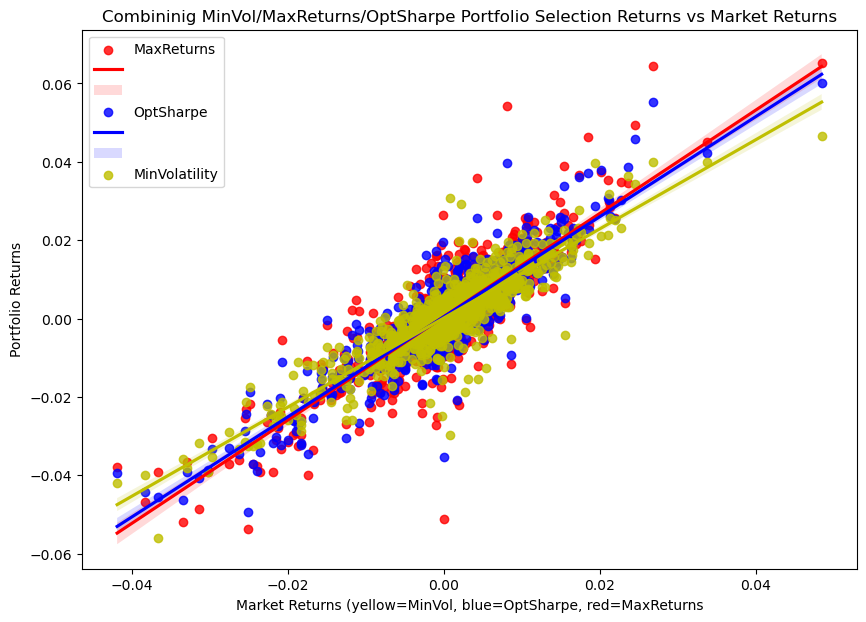

In [23]:
portfolio_min_volatility_returns_df = mpt_pe_compute_portfolio_returns(asset_prices_returns_df, portfolio_min_volatility)
portfolio_max_returns_returns_df = mpt_pe_compute_portfolio_returns(asset_prices_returns_df, portfolio_max_returns)
portfolio_opt_sharpe_ratio_volatility_returns_df = mpt_pe_compute_portfolio_returns(asset_prices_returns_df, portfolio_opt_sharpe_ratio)

plt.subplots(figsize=(10,7))

sns.regplot(asset_mkt_prices_returns_df['MARKET'], portfolio_max_returns_returns_df, color='r')
sns.regplot(asset_mkt_prices_returns_df['MARKET'], portfolio_opt_sharpe_ratio_volatility_returns_df, color='b')
sns.regplot(asset_mkt_prices_returns_df['MARKET'], portfolio_min_volatility_returns_df, color='y')
plt.xlabel("Market Returns (yellow=MinVol, blue=OptSharpe, red=MaxReturns")
plt.ylabel("Portfolio Returns")
plt.legend(["MaxReturns", "", "", "OptSharpe", "", "", "MinVolatility"])
plt.title("Combininig MinVol/MaxReturns/OptSharpe Portfolio Selection Returns vs Market Returns")
plt.show()

# ToDo:  Clean up legend (not sure how to do exclude parts of legend)

<AxesSubplot:title={'center':'Portfolio Composition - Min Volatility Protfolio'}, ylabel='weights'>

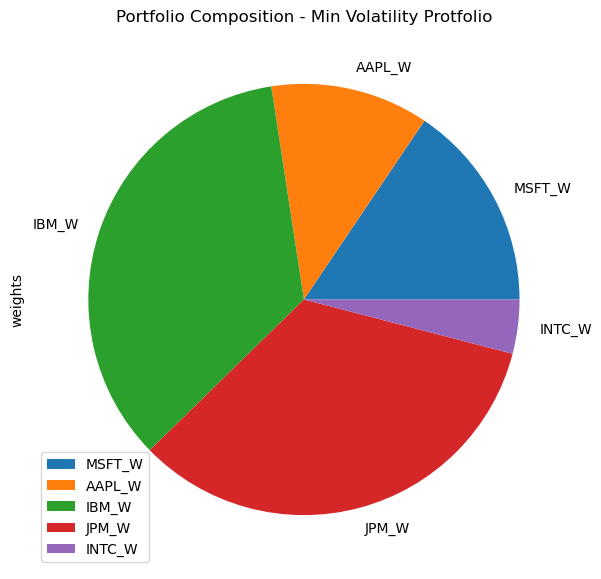

In [24]:
portfolio_min_volatility_weights = mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# plot the pie charts of the porfolio allocation/weights
portfolio_min_volatility_weights.plot.pie(y='weights', title='Portfolio Composition - Min Volatility Protfolio', figsize=(10,7))

<AxesSubplot:title={'center':'Portfolio Composition - Max Returns Protfolio'}, ylabel='weights'>

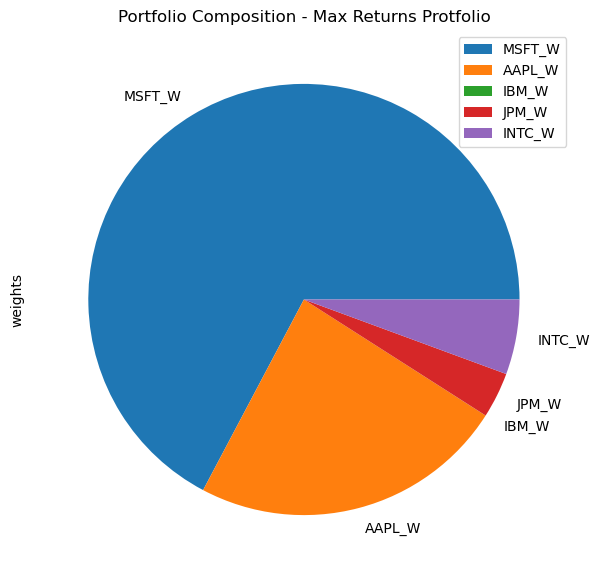

In [25]:
portfolio_max_returns_weights = mpt_pe_get_portfolio_weights_df(portfolio_max_returns)

# plot the pie charts of the porfolio allocation/weights
portfolio_max_returns_weights.plot.pie(y='weights', title='Portfolio Composition - Max Returns Protfolio', figsize=(10,7))

<AxesSubplot:title={'center':'Portfolio Composition - Opt Sharpe Ratio Protfolio'}, ylabel='weights'>

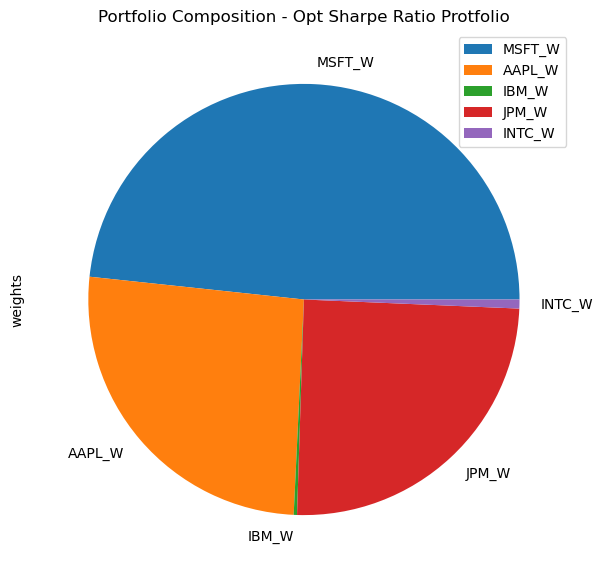

In [26]:
portfolio_opt_sharpe_ratio_weights = mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# plot the pie charts of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.plot.pie(y='weights', title='Portfolio Composition - Opt Sharpe Ratio Protfolio', figsize=(10,7))

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [27]:
asset_prices_test_beg_df = pd.DataFrame(asset_mkt_prices_full_df.iloc[num_historical_days_percent, :]).drop('MARKET', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(asset_mkt_prices_full_df.iloc[num_days_total-1, :]).drop('MARKET', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,MSFT,AAPL,IBM,JPM,INTC
2020-01-03,154.642166,72.967216,112.016426,127.048035,55.720173


,MSFT,AAPL,IBM,JPM,INTC
2020-12-31,219.139359,131.333542,110.466835,120.164391,47.337845


In [28]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_volatility_weights = mpt_pe_get_mc_weights(portfolio_min_volatility_weights)
portfolio_mc_max_returns_weights = mpt_pe_get_mc_weights(portfolio_max_returns_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)

In [29]:
investment_pnl_min_volatility = mpt_pe_compute_investment_pnl(initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_volatility_weights))[0][0]
investment_pnl_max_returns = mpt_pe_compute_investment_pnl(initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_returns_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt_pe_compute_investment_pnl(initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]

print("Actual realized portfolio value for minVol/maxReturns/optSharpe allocations:")
display(investment_pnl_min_volatility)
display(investment_pnl_max_returns)
display(investment_pnl_opt_sharpe_ratio)

Actual realized portfolio value for minVol/maxReturns/optSharpe allocations:


11172.841209411621

14459.537376403809

13971.95327758789

### Run Monte Carlo Simulations on the test dataframe and compute expected Returns and compare agains realized returns

In [30]:
print("Number of MC runs:", num_mc_runs)

Number of MC runs: 500


In [31]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('MARKET', axis=1, inplace=False)

In [32]:
# Arrange Monte Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [33]:
# Configure the Monte Carlo simulation to forecast 30 years cumulative returns
# The weights should be split 40% to AGG and 60% to SPY.
# Run 500 samples.
MC_min_volatility_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_volatility_weights,
    num_simulation = num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min Volatility)")
MC_min_volatility_portfolio.portfolio_data.tail(n=1)

Monte Carlo Portfolio (Min Volatility)


MSFT                     AAPL                     IBM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2020-12-30  218.410248    -0.011019  132.353012    -0.008527  109.11541   

                                JPM                    INTC               
           daily_return       close daily_return      close daily_return  
Date                                                                      
2020-12-30     0.004362  118.547333       0.0028  46.321156    -0.012958

In [34]:
# Run the Monte Carlo simulation to forecast 10 years cumulative returns
MC_min_volatility_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.975208,1.003695,1.011805,1.007361,0.983765,0.999156,1.000889,1.005247,0.987397,1.006213,...,0.998896,0.999818,1.008240,0.990735,0.997321,0.983180,1.007020,0.987296,1.027816,0.974448
2,0.977678,1.016121,1.000633,0.991655,0.984335,1.020136,1.001479,1.000707,1.002649,1.018891,...,0.987546,1.012137,0.997379,0.988900,0.956853,0.985897,1.020411,0.979593,1.039067,0.970424
3,0.991010,0.976830,0.995726,1.024636,0.976044,1.055689,1.006244,1.003521,1.009509,1.004196,...,1.020219,1.018644,1.008536,0.986808,0.981515,0.974643,1.037577,0.967692,1.029362,0.960455
4,0.989752,0.988641,1.001618,1.025371,0.993203,1.023767,1.015772,1.036150,0.991952,0.994778,...,1.035921,1.009980,1.003893,0.980670,0.982810,0.959404,1.027501,0.965851,1.051038,0.954012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.349063,1.253583,0.978227,1.120775,0.528846,1.235307,1.271363,1.353882,1.225178,2.063111,...,1.385001,1.347746,1.403038,0.985402,0.996353,1.095172,1.140030,0.916534,0.626325,1.121962
249,1.349619,1.264899,0.973476,1.080067,0.531348,1.248583,1.277358,1.389645,1.203597,2.067574,...,1.385105,1.377782,1.410329,0.987527,1.007635,1.124028,1.132137,0.908373,0.623568,1.136041
250,1.338474,1.271186,0.965315,1.105383,0.546126,1.236085,1.291746,1.377556,1.176356,2.022521,...,1.342761,1.381048,1.398626,0.969872,1.034814,1.127383,1.110149,0.929647,0.630872,1.154061
251,1.319751,1.256110,0.985270,1.119813,0.548795,1.205279,1.241553,1.362723,1.153022,2.020148,...,1.325762,1.383597,1.415977,0.975012,1.065134,1.145741,1.115865,0.926758,0.623008,1.138947


In [35]:
# Configure the Monte Carlo simulation to forecast 30 years cumulative returns
# The weights should be split 40% to AGG and 60% to SPY.
# Run 500 samples.
MC_max_returns_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_returns_weights,
    num_simulation = num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max Returns)")
MC_max_returns_portfolio.portfolio_data.tail(n=1)

Monte Carlo Portfolio (Max Returns)


MSFT                     AAPL                     IBM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2020-12-30  218.410248    -0.011019  132.353012    -0.008527  109.11541   

                                JPM                    INTC               
           daily_return       close daily_return      close daily_return  
Date                                                                      
2020-12-30     0.004362  118.547333       0.0028  46.321156    -0.012958

In [36]:
# Run the Monte Carlo simulation to forecast 10 years cumulative returns
MC_max_returns_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.005943,1.016392,0.975387,1.010278,0.966848,1.035980,1.006389,1.012150,1.033097,1.015254,...,1.002588,1.024074,1.044148,0.992650,0.995961,0.970546,1.004728,0.995619,1.015622,1.008404
2,1.006061,1.004348,0.979033,1.039597,0.945345,1.025459,0.994256,1.021821,1.028832,1.023410,...,1.002056,1.021285,1.055505,1.003037,1.010633,0.960473,0.982761,0.966688,1.011146,1.023656
3,0.996065,0.966720,0.993035,1.043228,0.967612,1.023043,1.013497,1.030050,1.030268,1.035986,...,0.987899,1.046622,1.068637,0.964125,1.026288,0.942982,0.992905,0.980385,1.033978,1.008331
4,1.020214,0.978862,1.014245,1.039013,0.959966,0.981790,1.000824,1.042583,0.987208,1.030323,...,0.987221,1.046070,1.051810,0.986307,1.055672,0.914207,1.008826,0.978003,1.003805,1.031927
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,2.295574,1.656976,1.302060,0.838355,1.421695,1.634371,2.707638,3.011848,2.739746,2.173252,...,2.051891,1.029132,1.422700,2.033441,1.350276,0.883564,1.847085,1.236939,1.157176,1.541735
249,2.328486,1.676118,1.298533,0.827610,1.391172,1.626194,2.702500,2.898162,2.698344,2.136939,...,2.050588,1.053349,1.413348,2.066229,1.386895,0.902976,1.830567,1.248567,1.129520,1.526830
250,2.397096,1.666209,1.290621,0.814418,1.391471,1.628067,2.865456,2.875157,2.772687,2.153169,...,2.077972,1.050472,1.416886,2.060811,1.403800,0.896686,1.790237,1.282600,1.142000,1.528100
251,2.409786,1.662469,1.311349,0.828654,1.395865,1.638117,2.935876,2.886700,2.771549,2.124915,...,2.121922,1.045985,1.423506,2.111612,1.438780,0.905321,1.743822,1.342485,1.155156,1.560034


In [37]:
# Configure the Monte Carlo simulation to forecast 30 years cumulative returns
# The weights should be split 40% to AGG and 60% to SPY.
# Run 500 samples.
MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail(n=1)

Monte Carlo Portfolio (Opt Sharpe)


MSFT                     AAPL                     IBM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2020-12-30  218.410248    -0.011019  132.353012    -0.008527  109.11541   

                                JPM                    INTC               
           daily_return       close daily_return      close daily_return  
Date                                                                      
2020-12-30     0.004362  118.547333       0.0028  46.321156    -0.012958

In [38]:
# Run the Monte Carlo simulation to forecast 10 years cumulative returns
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.003464,1.008205,1.028076,0.996084,1.004324,0.973339,0.988767,0.986973,1.000282,1.000456,...,1.000871,0.986485,1.001438,0.968409,1.011154,1.002487,1.020071,1.014992,1.014762,0.993954
2,1.014039,1.035050,1.017706,1.007911,0.972835,0.957655,0.999854,1.012207,0.993517,1.021766,...,0.994398,1.009562,1.003485,0.960654,1.004419,1.033949,0.979909,1.030586,1.014539,0.947329
3,1.050923,0.997954,1.000419,1.006492,0.961363,0.965720,1.005628,1.009297,1.010323,1.036116,...,1.023281,0.975958,0.994358,0.964735,1.024561,1.039543,0.991405,1.027218,1.008587,0.928297
4,1.029820,1.002091,1.006380,1.025858,0.953145,0.970387,0.990067,1.001319,1.007012,1.060970,...,1.027863,0.974088,0.976059,0.958504,1.010972,1.055186,1.009343,1.062585,0.990538,0.962831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.287370,1.275413,1.818986,1.201459,1.218759,1.379596,2.104989,0.931548,1.421555,0.955915,...,1.498191,1.118433,1.457372,0.626734,1.536473,1.483509,1.622685,1.458090,1.040401,1.294354
249,1.331769,1.303805,1.849579,1.180267,1.225072,1.410051,2.131190,0.942677,1.392616,0.944709,...,1.551852,1.143208,1.457845,0.616732,1.521901,1.479520,1.644761,1.410625,1.058364,1.283550
250,1.336110,1.306468,1.859576,1.178289,1.228395,1.372933,2.126608,0.951831,1.399182,0.945280,...,1.553466,1.140921,1.479572,0.613210,1.533318,1.493915,1.631755,1.390083,1.058704,1.287641
251,1.314416,1.277780,1.887352,1.184687,1.205535,1.415969,2.209185,0.967577,1.387402,0.917590,...,1.563853,1.164050,1.492684,0.617002,1.527144,1.453574,1.644222,1.405712,1.083728,1.322426


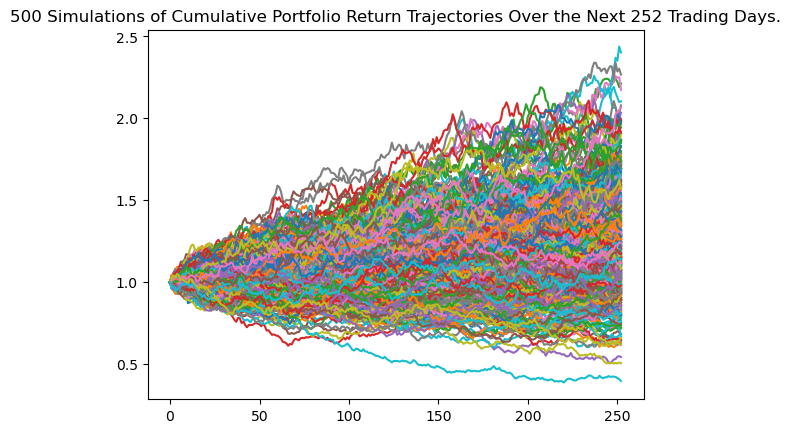

In [39]:
# Visualize the 30-year Monte Carlo simulation by creating an
# overlay line plot
line_plot_min_volatility_portfolio_plot = MC_min_volatility_portfolio.plot_simulation()

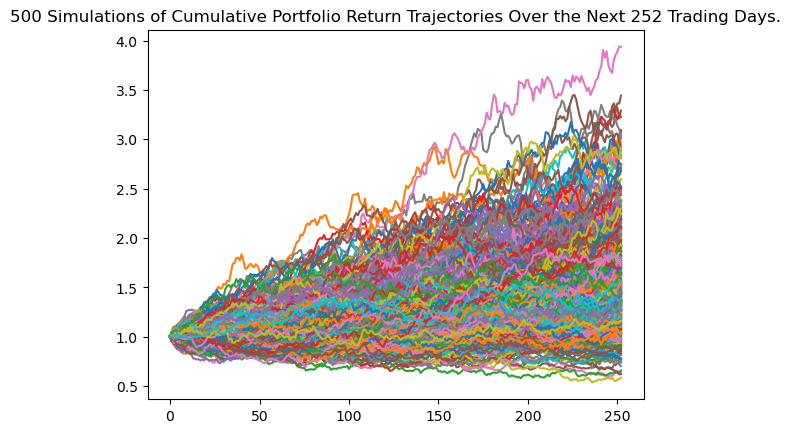

In [40]:
# Visualize the 30-year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_returns_portfolio_plot = MC_max_returns_portfolio.plot_simulation()

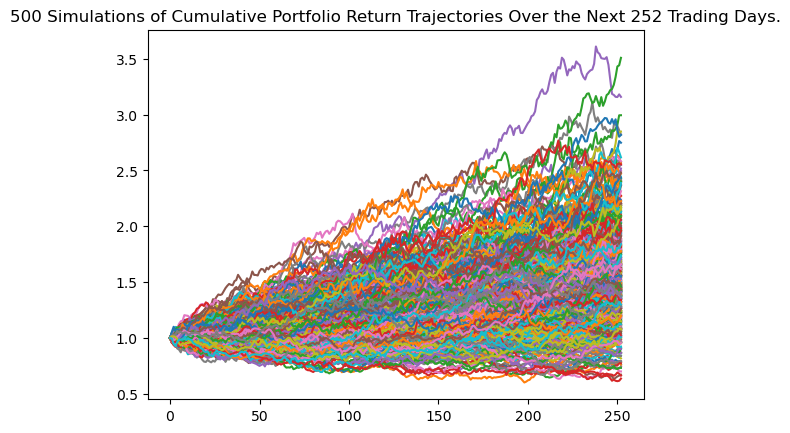

In [41]:
# Visualize the 30-year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

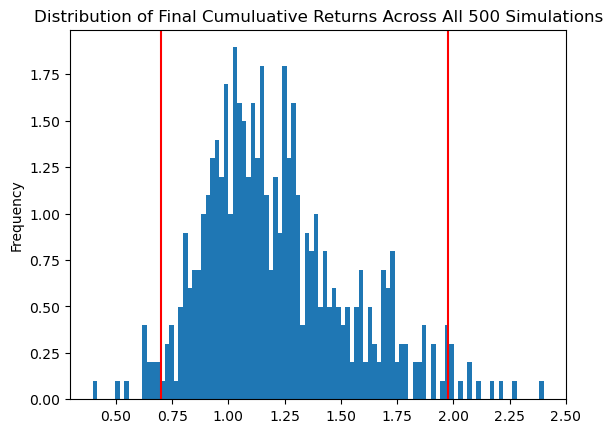

In [42]:
# Visualize the probability distribution of the 30-year Monte Carlo simulation 
# by plotting a histogram
distribution_plot_min_volatility_portfolio_plot = MC_min_volatility_portfolio.plot_distribution()

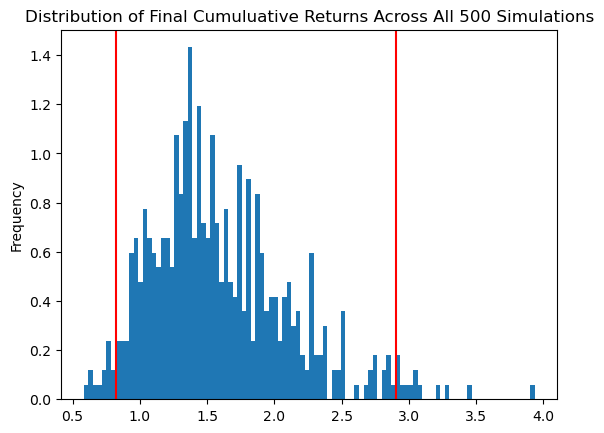

In [43]:
# Visualize the probability distribution of the 30-year Monte Carlo simulation 
# by plotting a histogram
distribution_plot_max_returns_portfolio_plot = MC_max_returns_portfolio.plot_distribution()

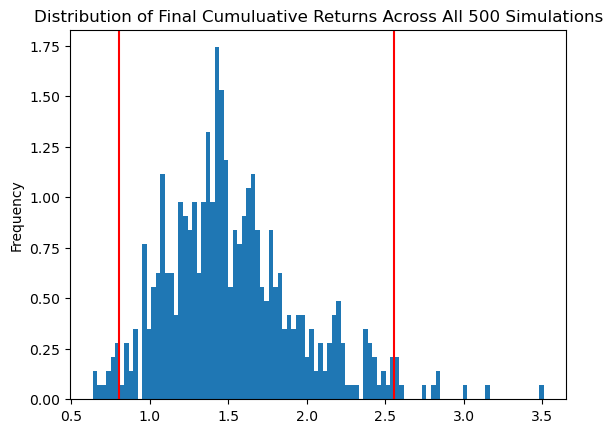

In [44]:
# Visualize the probability distribution of the 30-year Monte Carlo simulation 
# by plotting a histogram
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

In [45]:
# Generate summary statistics from the 30-year Monte Carlo simulation results
# Save the results as a variable
table_min_volatility_portfolio_weight = MC_min_volatility_portfolio.summarize_cumulative_return()

# Review the 30-year Monte Carlo summary statistics
print(table_min_volatility_portfolio_weight)

count           500.000000
mean              1.216533
std               0.322625
min               0.397252
25%               0.986558
50%               1.157562
75%               1.390561
max               2.401820
95% CI Lower      0.699550
95% CI Upper      1.974813
Name: 252, dtype: float64


In [46]:
# Generate summary statistics from the 30-year Monte Carlo simulation results
# Save the results as a variable
table_max_returns_portfolio_weight = MC_max_returns_portfolio.summarize_cumulative_return()

# Review the 30-year Monte Carlo summary statistics
print(table_max_returns_portfolio_weight)

count           500.000000
mean              1.596136
std               0.522035
min               0.583740
25%               1.242105
50%               1.502166
75%               1.876090
max               3.936149
95% CI Lower      0.819364
95% CI Upper      2.903208
Name: 252, dtype: float64


In [47]:
# Generate summary statistics from the 30-year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 30-year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           500.000000
mean              1.534729
std               0.434762
min               0.636615
25%               1.239154
50%               1.461757
75%               1.761706
max               3.507935
95% CI Lower      0.803457
95% CI Upper      2.551284
Name: 252, dtype: float64


In [48]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [49]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN Volatility portfolio

# get the lower and upper CI values
ci_lower_95per = table_min_volatility_portfolio_weight[8]
ci_upper_95per = table_min_volatility_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current MIN Volatility portfolio value of ${initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio is ${investment_pnl_min_volatility:0.2f}")


There is a 95% chance that the current MIN Volatility portfolio value of $10000.00, will end within the range of $6995.50 and $19748.13.
The actual realized value of the portfolio is $11172.84


In [50]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX Returns portfolio

# get the lower and upper CI values
ci_lower_95per = table_max_returns_portfolio_weight[8]
ci_upper_95per = table_max_returns_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current MAX Returns portfolio value of ${initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio is ${investment_pnl_max_returns:0.2f}")


There is a 95% chance that the current MAX Returns portfolio value of $10000.00, will end within the range of $8193.64 and $29032.08.
The actual realized value of the portfolio is $14459.54


In [51]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current OPT SHARPE RATIO  portfolio value of ${initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio is ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current OPT SHARPE RATIO  portfolio value of $10000.00, will end within the range of $8034.57 and $25512.84.
The actual realized value of the portfolio is $13971.95
